### Imports

In [20]:
import pandas as pd
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np 
from scipy.stats import norm
from sklearn.manifold import MDS
import os 
import csv
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics.pairwise import cosine_similarity
import torch 
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torch.nn.utils.rnn import pad_sequence
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from torch.nn import init
from scipy.stats import gaussian_kde

### Labour & Conservative

In [21]:
#Get the number of unique followees that aren't MPs, first 100 MPs for both Labour & Conservative
df =  pd.read_csv('dataset.csv', lineterminator='\n', low_memory=False)
df = df.iloc[:301009]

tory_df = pd.read_csv('tory.csv', lineterminator='\n', low_memory=False)
tory_df = tory_df.iloc[:182865]

mps = pd.read_csv('Seun - Sheet1.csv')
tory_mps = pd.read_csv('tory_mp.csv')

num_unique_entries = df['profileUrl'].unique().tolist()
num_unique_mps = df["query"].unique().tolist()

num_unique_tory_entries = tory_df['profileUrl'].unique().tolist()

num_unqiue_tory_mps = tory_df["query"].unique().tolist()

for mp in num_unique_mps:
    if mp in num_unique_entries:
        num_unique_entries.remove(mp)

for tory in num_unqiue_tory_mps:
    if tory in num_unique_tory_entries:
        num_unique_tory_entries.remove(tory)
        
print("Labour: ")
print("Set of MPs", len(num_unique_mps))        
print("Number of unique followees that aren't MPs:", len(num_unique_entries))
print('\n')
print("Conservative: ")
print("Set of MPs:", len(num_unqiue_tory_mps))        
print("Number of unique followees that aren't MPs:", len(num_unique_tory_entries))

Labour: 
Set of MPs 100
Number of unique followees that aren't MPs: 137726


Conservative: 
Set of MPs: 100
Number of unique followees that aren't MPs: 91488


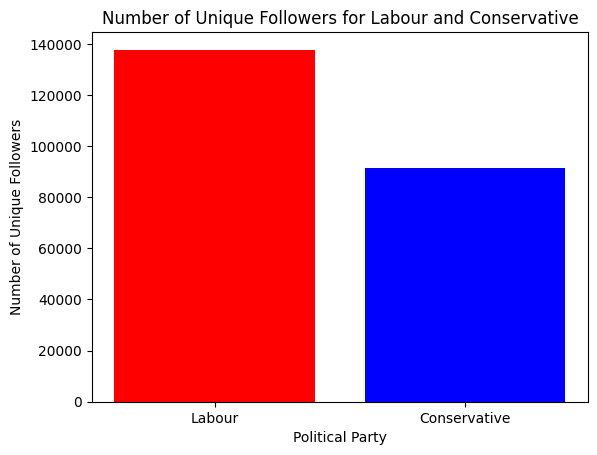

In [22]:
parties = ['Labour', 'Conservative']
followers_counts = [len(num_unique_entries), len(num_unique_tory_entries)]

# Plotting
plt.bar(parties, followers_counts, color=['red', 'blue'])
plt.xlabel('Political Party')
plt.ylabel('Number of Unique Followers')
plt.title('Number of Unique Followers for Labour and Conservative')
plt.savefig("name.pdf")
plt.show()

In [23]:
#deletes all entries of MPs following other MPs from the database
mps = mps['MPs'].tolist()
tory_mps = tory_mps['MPs'].tolist()

tory_df = tory_df[~tory_df['profileUrl'].isin(tory_mps)]
df = df[~df['profileUrl'].isin(mps)]

In [24]:
print(tory_df)

                                 profileUrl       screenName userId  \
0       https://twitter.com/christiancalgie  christiancalgie    NaN   
2           https://twitter.com/MrHarryCole      MrHarryCole    NaN   
3            https://twitter.com/NJ_Timothy       NJ_Timothy    NaN   
5              https://twitter.com/rcolvile         rcolvile    NaN   
7             https://twitter.com/GregHands        GregHands    NaN   
...                                     ...              ...    ...   
182859    https://twitter.com/TelegraphNews    TelegraphNews    NaN   
182860      https://twitter.com/BBCBusiness      BBCBusiness    NaN   
182861          https://twitter.com/AnnickD          AnnickD    NaN   
182862      https://twitter.com/birkenkrahe      birkenkrahe    NaN   
182863        https://twitter.com/CCHQPress        CCHQPress    NaN   

                             name  \
0                          Calgie   
2                      Harry Cole   
3                    Nick Timothy   

In [25]:
def create_dict(df):
    folowees = defaultdict(list)
    for index, row in df.iterrows():
        query = row['query']
        url = row['profileUrl']
        
        if url in num_unique_mps:
            print("here")
            continue 
        
        folowees[query].append(url)
              
    return folowees

In [26]:
def in_degree(df):
    followers = {}
    
    for index, row in df.iterrows():
        url = row['profileUrl']
        if url not in followers:
            followers[url] = 1
        elif url in num_unique_mps:
            continue 
        else:
            followers[url] += 1
            
    return followers

In [27]:
#create a dictionary of all the Labour MPs and who they follow (not including MPs)
data = create_dict(df)
degree = in_degree(df)

sorted_data = sorted(data.items(), key=lambda x: len(x[1]), reverse=True)

sorted_degree = sorted(degree.items(), key=lambda x: x[1], reverse=True)

sorted_dict = dict(sorted_data)
sorted_degree = dict(sorted_degree)


In [28]:
data['https://www.twitter.com/Debbie_abrahams']

['https://twitter.com/OldhamCouncil',
 'https://twitter.com/johnpringdns',
 'https://twitter.com/shah_arooj',
 'https://twitter.com/amanda_chadd',
 'https://twitter.com/DianaJohnsonMP',
 'https://twitter.com/LizMcInnes60',
 'https://twitter.com/lukeakehurst',
 'https://twitter.com/Heidi_Labour',
 'https://twitter.com/SaddIndependent',
 'https://twitter.com/ACunninghamMP',
 'https://twitter.com/ChadWeather',
 'https://twitter.com/KatyBruce108',
 'https://twitter.com/PaulPaulbutcher',
 'https://twitter.com/ModerateUK',
 'https://twitter.com/oliversoeser',
 'https://twitter.com/1james_elder',
 'https://twitter.com/thomasbrake',
 'https://twitter.com/Rufusbarry',
 'https://twitter.com/rosie_wrighting',
 'https://twitter.com/exitthelemming',
 'https://twitter.com/Linzi_BPL',
 'https://twitter.com/umair_iftikhar_',
 'https://twitter.com/MattyTHurst',
 'https://twitter.com/Shabana00559915',
 'https://twitter.com/NissenIn',
 'https://twitter.com/jaleel_abubakar',
 'https://twitter.com/suecor',

In [29]:
tory_data = create_dict(tory_df)
tory_degree = in_degree(tory_df)

sorted_tory_data = sorted(tory_data.items(), key = lambda x: len(x[1]), reverse = True)
sorted_tory_degree = sorted(tory_degree.items(), key = lambda x: x[1], reverse = True)


sorted_tory_dict = dict(sorted_tory_data)
sorted_tory_degree = dict(sorted_tory_degree)

In [30]:
labourData = dict(data)
conservativeData = dict(tory_data)

In [31]:
sorted_dict_num = {}

for key in sorted_dict:
    sorted_dict_num[key] = len(sorted_dict[key])
    
sorted_tory_dict_num = {}

for key in sorted_tory_dict:
    sorted_tory_dict_num[key] = len(sorted_tory_dict[key])

In [32]:
ranked_tory_data = [(rank, key, len(sorted_tory_dict[key])) for rank ,key in enumerate (sorted_tory_dict, start = 1)]

df_tory_ranked = (pd.DataFrame(ranked_tory_data, columns = ['Rank', 'Key', 'Followees'])).to_string(index = False)
print(df_tory_ranked)

 Rank                                     Key  Followees
    1   https://www.twitter.com/DamianCollins       9699
    2  https://www.twitter.com/JamesDuddridge       9354
    3   https://www.twitter.com/JamesCleverly       7636
    4  https://www.twitter.com/theodoraclarke       6407
    5 https://www.twitter.com/michelledonelan       5735
    6    https://www.twitter.com/baynes_simon       4500
    7 https://www.twitter.com/Siobhan_Baillie       4097
    8  https://www.twitter.com/philipdaviesuk       4076
    9       https://www.twitter.com/Nus_Ghani       3980
   10    https://www.twitter.com/robertcourts       3647
   11    https://www.twitter.com/alexburghart       3627
   12     https://www.twitter.com/drlukeevans       3597
   13        https://www.twitter.com/hbaldwin       3548
   14      https://www.twitter.com/marcusfysh       3310
   15   https://www.twitter.com/paulbristow79       3176
   16  https://www.twitter.com/DehennaDavison       3110
   17         https://www.twitt

In [33]:
ranked_data = [(rank, key, len(sorted_dict[key])) for rank, key in enumerate(sorted_dict, start=1)]

# Convert the list into a DataFrame
df_ranked = pd.DataFrame(ranked_data, columns=['Rank', 'Key', 'Followees'])

df_ranked = df_ranked.to_string(index=False)

print(df_ranked)

 Rank                                     Key  Followees
    1     https://www.twitter.com/DanJarvisMP      10852
    2      https://www.twitter.com/SDoughtyMP       9875
    3  https://www.twitter.com/RosieDuffield1       9606
    4    https://www.twitter.com/stellacreasy       9046
    5        https://www.twitter.com/TanDhesi       8662
    6     https://www.twitter.com/FloEshalomi       8610
    7     https://www.twitter.com/labourlewis       7637
    8 https://www.twitter.com/Debbie_abrahams       7553
    9        https://www.twitter.com/DrRosena       7495
   10     https://www.twitter.com/liambyrnemp       7389
   11 https://www.twitter.com/DawnButlerBrent       6888
   12    https://www.twitter.com/PreetKGillMP       5698
   13    https://www.twitter.com/Afzal4Gorton       5566
   14    https://www.twitter.com/darrenpjones       5508
   15      https://www.twitter.com/DavidLammy       5130
   16  https://www.twitter.com/JulieElliottMP       4868
   17 https://www.twitter.com/A

In [34]:
tory_degree_ranked = [(rank, key, sorted_tory_degree[key]) for rank, key in enumerate(sorted_tory_degree, start=1)]

tory_degree_ranked = (pd.DataFrame(tory_degree_ranked,columns=['Rank', 'Key' ,'Followers']))
print(tory_degree_ranked)

        Rank                                  Key  Followers
0          1  https://twitter.com/10DowningStreet         92
1          2    https://twitter.com/PennyMordaunt         91
2          3    https://twitter.com/Conservatives         89
3          4      https://twitter.com/Jeremy_Hunt         88
4          5        https://twitter.com/CCHQPress         87
...      ...                                  ...        ...
91245  91246    https://twitter.com/michaelturner          1
91246  91247        https://twitter.com/NeilPoole          1
91247  91248        https://twitter.com/mjhbessey          1
91248  91249          https://twitter.com/AnnickD          1
91249  91250      https://twitter.com/birkenkrahe          1

[91250 rows x 3 columns]


In [35]:
degree_ranked = [(rank, key,sorted_degree[key]) for rank, key in enumerate(sorted_degree, start=1)]

# Convert the list into a DataFrame
degree_ranked = pd.DataFrame(degree_ranked, columns=['Rank', 'Key', 'Followers'])

degree_ranked = degree_ranked.to_string(index=False)
print(degree_ranked)


  Rank                                 Key  Followers
     1        https://twitter.com/UKLabour         96
     2      https://twitter.com/LabourList         93
     3     https://twitter.com/labourwhips         92
     4     https://twitter.com/JonAshworth         90
     5     https://twitter.com/labourpress         90
     6 https://twitter.com/Alison_McGovern         89
     7      https://twitter.com/tom_watson         88
     8     https://twitter.com/Ed_Miliband         88
     9       https://twitter.com/paulwaugh         88
    10 https://twitter.com/Debbie_abrahams         87
    11    https://twitter.com/Heidi_Labour         86
    12     https://twitter.com/angelaeagle         86
    13   https://twitter.com/LabourLordsUK         85
    14    https://twitter.com/leicesterliz         85
    15       https://twitter.com/bbclaurak         85
    16       https://twitter.com/SadiqKhan         85
    17   https://twitter.com/GloriaDePiero         84
    18     https://twitter.c

## Visualisation

TypeError: unhashable type: 'numpy.ndarray'

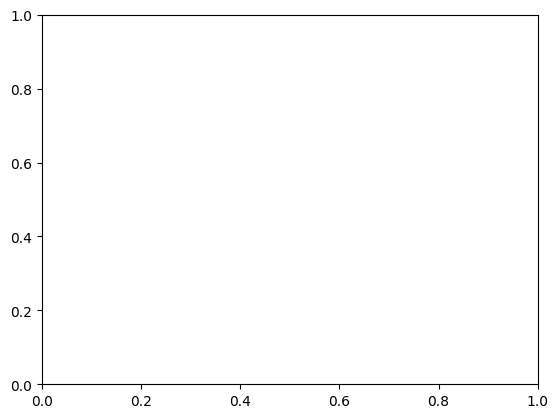

In [59]:
xes = ranked_data
plt.plot(xes)

In [36]:
degree_ranked = [(rank, key,sorted_degree[key]) for rank, key in enumerate(sorted_degree, start=1)]

arr = sorted_degree.values()
tarr = []
for i in arr:
    tarr.append(i)



In [37]:
'''  
TODO:
- Use more bins (~200)
'''
def calculate_stats_and_plot(values, label, ax):
    mean = np.mean(values)
    std_dev = np.std(values)
    x = np.linspace(min(values), max(values), 100)
    pdf = norm.pdf(x, mean, std_dev)
    ax.set_xlabel('Followees')
    ax.set_ylabel('PDF(Gaussian Probability Density Function)')
    ax.hist(values, bins=15, density=True, alpha=0.75)
    ax.plot(x, pdf, 'r-', lw=2)

    ax.set_xlim(min(values), max(values))
    ax.set_ylim(10**(-6),10**(-3))
    ax.axvline(mean, color='red', linestyle='dashed', linewidth=2, label='Mean')
    ax.axvline(mean + std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean + 1 SD')
    ax.axvline(mean - std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean - 1 SD')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.legend()

    ax.set_title(f'Distribution of {label} & followees')

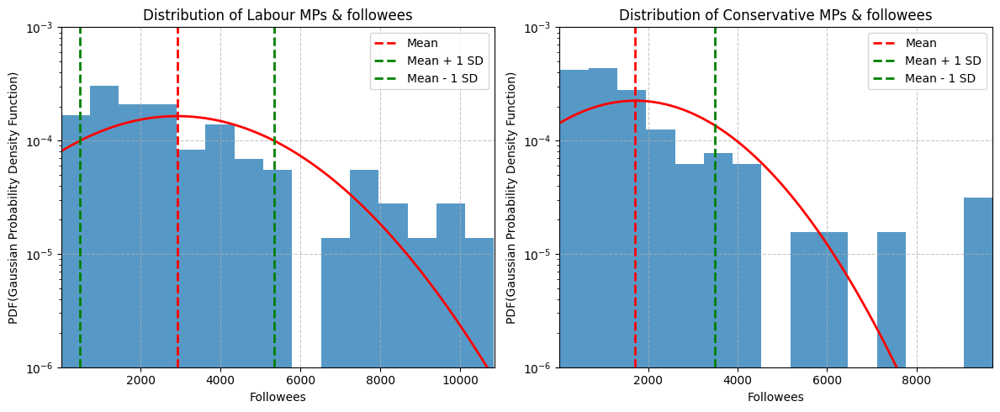

In [38]:
# Create a 1x2 grid of subplots
''' 
TODO:
- Use the same plot
- Show as percentage (PDF)
'''
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Assuming sorted_dict_num and sorted_tory_dict_num are dictionaries with values you want to plot
values = list(sorted_dict_num.values())
tory_values = list(sorted_tory_dict_num.values())

# Plot the first distribution
calculate_stats_and_plot(values, 'Labour MPs', axes[0])
axes[0].set_yscale('log')

# Plot the second distribution
calculate_stats_and_plot(tory_values, 'Conservative MPs', axes[1])
axes[1].set_yscale('log')

plt.tight_layout()
plt.show()

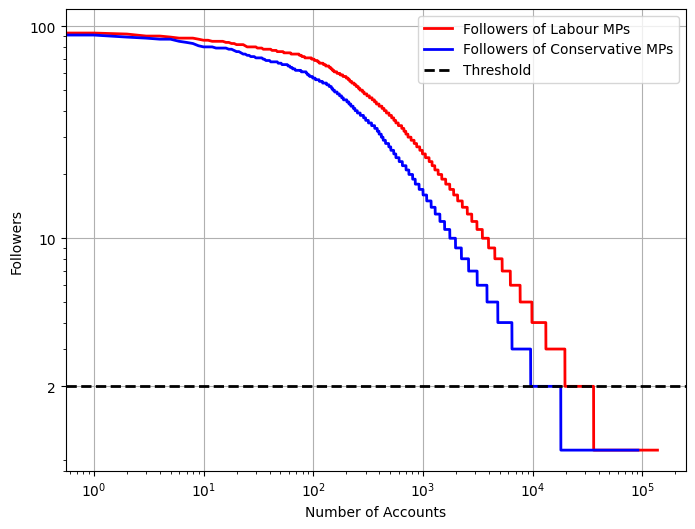

In [39]:
degree_ranked = [(rank, key,sorted_degree[key]) for rank, key in enumerate(sorted_degree, start=1)]
tory_degree_ranked = [(rank, key, sorted_tory_degree[key]) for rank, key in enumerate(sorted_tory_degree, start=1)]

arr = sorted_degree.values()
tory_arr = sorted_tory_degree.values()
tarr = []
barr = []
for i in arr:
    tarr.append(i)

for i in tory_arr:
    barr.append(i)

x = np.linspace(1, len(tarr))
x2 = np.linspace(1, len(barr))

plt.figure(figsize=(8,6))
# plt.ylim(1, 100)

plt.plot(tarr, linewidth = 2, color = 'r', label = 'Followers of Labour MPs')
plt.plot(barr, linewidth = 2, color = 'b', label = 'Followers of Conservative MPs')
plt.grid(True)
plt.xscale('log')
plt.yscale('log')
plt.axhline(y = 2, color = 'black', linestyle = '--', linewidth = 2, label = 'Threshold')
plt.legend()
plt.yticks([ 2, 10, 100], ['2', '10', '100'])
plt.xlabel('Number of Accounts')
plt.ylabel('Followers')
plt.show()

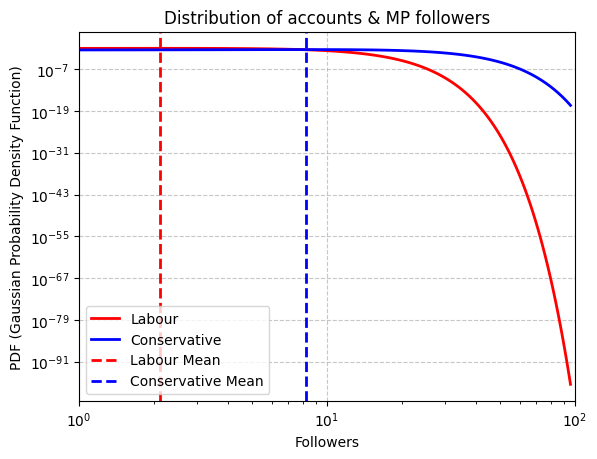

Labour mean:  2.1174311526525034
Labour standard deviation:  4.456031804827597
Conservative mean:  8.222164303586322
Conservative standard deviation:  10.225550427938932
137587 9592


In [40]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# First dataset
values1 = list(sorted_degree.values())
# Data cleaning: removing accounts with only 1 MP following them
values1 = [x for x in values1 if x > 0]
# Calculate mean and standard deviation
mean1 = np.mean(values1)
std_dev1 = np.std(values1)

# Second dataset
values2 = list(sorted_tory_degree.values())
# Data cleaning: removing accounts with only 1 MP following them
values2 = [x for x in values2 if x > 2]
# Calculate mean and standard deviation
mean2 = np.mean(values2)
std_dev2 = np.std(values2)

# Create range of values for x-axis
x = np.linspace(0, max(max(values1), max(values2)), 100)

# Calculate PDF for both datasets
pdf1 = norm.pdf(x, mean1, std_dev1)
pdf2 = norm.pdf(x, mean2, std_dev2)

# Plot both lines
plt.plot(x, pdf1, 'r-', lw=2, label='Labour')
plt.plot(x, pdf2, 'b-', lw=2, label='Conservative')

plt.xlabel('Followers')
plt.ylabel('PDF (Gaussian Probability Density Function)')
# plt.xlim(0, max(max(values1), max(values2)))  # Set x-axis limits to start from 0
plt.xlim(1,100)  # Set x-axis limits to start from 0
plt.axvline(mean1, color='red', linestyle='dashed', linewidth=2, label='Labour Mean')
plt.axvline(mean2, color='blue', linestyle='dashed', linewidth=2, label='Conservative Mean')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.title('Distribution of accounts & MP followers')

plt.xscale('log')
plt.yscale('log')

plt.show()

print('Labour mean: ', mean1)
print('Labour standard deviation: ', std_dev1)
print('Conservative mean: ', mean2)
print('Conservative standard deviation: ', std_dev2)
print(len(values1), len(values2))


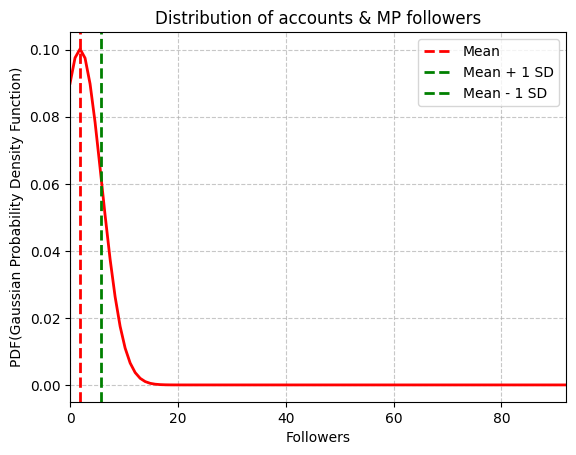

mean:  1.8520219178082191
standard deviation:  3.98009134879152


In [41]:
values = list(sorted_tory_degree.values())
# data cleaning, a lot of accounts with only 1 MP following them, skews the data
values = [x for x in values if x > 0]
# get mean and standard deviataion
mean = np.mean(values)
std_dev  = np.std(values)

# range of values for x-axis
x = np.linspace(0, max(values), 100)
pdf = norm.pdf(x, mean, std_dev)

plt.xlabel('Followers')
plt.ylabel('PDF(Gaussian Probability Density Function)')
# plt.hist(values, bins = max(values), density = True, alpha = 0.75)
plt.plot(x, pdf, 'r-', lw=2)

plt.xlim(0, max(values))  # Set x-axis limits to start from 0
plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label='Mean')
plt.axvline(mean + std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean + 1 SD')
plt.axvline(mean - std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean - 1 SD')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.title('Distribution of accounts & MP followers')
plt.show()

print('mean: ', mean)
print('standard deviation: ', std_dev)


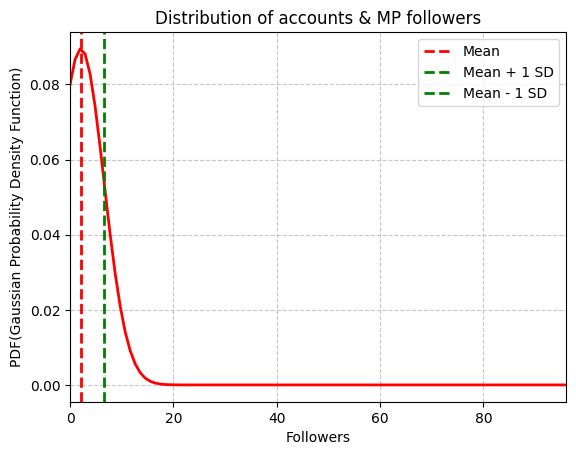

mean:  2.1174311526525034
standard deviation:  4.456031804827597


In [42]:
values = list(sorted_degree.values())
# data cleaning, a lot of accounts with only 1 MP following them, skews the data
values = [x for x in values if x > 0]
# get mean and standard deviataion
mean = np.mean(values)
std_dev  = np.std(values)

# range of values for x-axis
x = np.linspace(0, max(values), 100)
pdf = norm.pdf(x, mean, std_dev)

plt.xlabel('Followers')
plt.ylabel('PDF(Gaussian Probability Density Function)')
# plt.hist(values, bins = max(values), density = True, alpha = 0.75)
plt.plot(x, pdf, 'r-', lw=2)

plt.xlim(0, max(values))  # Set x-axis limits to start from 0
plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label='Mean')
plt.axvline(mean + std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean + 1 SD')
plt.axvline(mean - std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean - 1 SD')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()

plt.title('Distribution of accounts & MP followers')
plt.show()

print('mean: ', mean)
print('standard deviation: ', std_dev)

In [43]:
def clean_and_plot(values, label, ax, k):
    # Data cleaning, removing values less than or equal to 20
    values = [x for x in values if x > k and x < 81]

    mean = np.mean(values)
    std_dev = np.std(values)
    x = np.linspace(0, max(values), 100)
    pdf = norm.pdf(x, mean, std_dev)
    

    ax.set_xlabel('Followers')
    ax.set_ylabel('PDF(Gaussian Probability Density Function)')
    ax.hist(values, bins=max(values), density=True, alpha=0.75)
    ax.plot(x, pdf, 'r-', lw=2)
    
    ax.set_xlim(0, max(values))
    ax.set_ylim(10**(-4), 1)
    ax.axvline(mean, color='red', linestyle='dashed', linewidth=2, label='Mean')
    ax.axvline(mean + std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean + 1 SD')
    ax.axvline(mean - std_dev, color='green', linestyle='dashed', linewidth=2, label='Mean - 1 SD')
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.legend()
    plt.yscale('log')
    ax.set_title(f'Distribution of accounts & {label} MP followers')


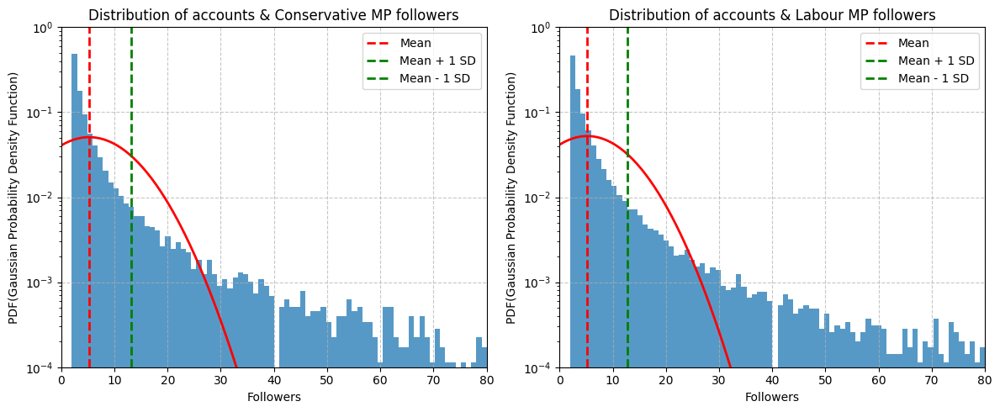

In [44]:
# Create a 1x2 grid of subplots
'''  
TODO:
- Fit line (not gaussian)
'''
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Assuming sorted_degree is a dictionary with values you want to plot
values_degree = list(sorted_degree.values())
tory_values_degree = list(sorted_tory_degree.values())

# Plot the first distribution
clean_and_plot(tory_values_degree, 'Conservative', axes[0], 1)
axes[0].set_yscale('log')
# Plot the second distribution 
clean_and_plot(values_degree, 'Labour', axes[1], 1)
axes[1].set_yscale('log')

plt.tight_layout()
plt.show()

## Ground Truth 

In [45]:
names = pd.read_csv('twitterHandles.csv',low_memory=False)
output = 'newFinalVote.csv'
voting_record = defaultdict(list)
folder_path = 'newVotingHistory'
for file_name in os.listdir(folder_path):
    file_path = os.path.join(folder_path, file_name)
    with open(file_path, 'r') as f:
        lines = f.readlines()
    current_vote = None

    for line in lines:
        line = line.strip()
        
        if line == 'Ayes':
            current_vote = 1
        elif line == 'Noes':
            current_vote = -1
        elif line == 'No Vote Recorded':
            current_vote = 0
        elif 'Ayes:' in line:
            mp_info = line.split(': ')[1]
            mp_list = mp_info.split(' and ')
            
            for mp in mp_list:
                parts = mp.split('(')
                mp_name = parts[0].strip()
                
                # Store voting record in the dictionary
                voting_record[mp_name].append(1)
                
        elif 'Noes:' in line:
            mp_info = line.split(': ')[1]
            mp_list = mp_info.split(' and ')
            
            for mp in mp_list:
                parts = mp.split('(')
                mp_name = parts[0].strip()
                
                # Store voting record in the dictionary
                voting_record[mp_name].append(-1)
        
                
        elif line and '(' in line and ')' in line and 'Bill' not in line:
            parts = line.split('(')
            mp_name = parts[0].strip()
            voting_record[mp_name].append(current_vote)

print(dict(voting_record))

for index, row in names.iterrows():
    twitterHandle = row['twitterHandle']
    name = row['Name']
    name = name.rstrip()
    votingRecord = voting_record[name]
    
    if len(votingRecord) == 0:
        print(name)
        break
    
    with open(output, mode='a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([twitterHandle] + votingRecord)

# dict(voting_record)
    

{'Mary Glindon': [1, 0, 1, 1, -1, -1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, 1, 1, 1, -1, -1, 1, -1, 1, 1], 'Colleen Fletcher': [1, 1, 0, 0, 0, 0, 1, 1, 1, 1, -1, 0, -1, -1, 0, 0, 0, -1, -1, 1, -1, 1, 1, 1, -1, -1, 1, -1, 1, 1], 'Steve Double': [-1, -1, -1, -1, 1, 1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, -1, -1, 1, 1, -1, -1, -1, -1], 'Newquay)': [-1, 1, 1, -1], 'Robert Largan': [-1, -1, -1, -1, 1, 1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, -1, -1, 1, 1, -1, -1, -1, -1], 'Diane Abbott': [1, 1, 0, 1, -1, -1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, 0, 0, 0, 0, 0, 0, 0, -1, 1, 1], 'Debbie Abrahams': [1, 1, 1, 0, -1, 0, 1, 1, 0, 0, 0, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, 1, 1, 0, -1, -1, 1, -1, 1, 1], 'Rushanara Ali': [1, 1, 0, 1, -1, 0, 1, 1, 1, 0, 0, 0, -1, -1, -1, -1, -1, 0, 0, 1, -1, 1, 1, 1, 0, 0, 0, -1, 1, 1], 'Tahir Ali': [1, 1, 1, 1, -1, -1, 1, 1, 1, 1, -1, -1, 0, -1, -1, -1, -1, -1, -1, 1, -1, 1, 1, 1, -1, -1, 1, -1, 1, 1]

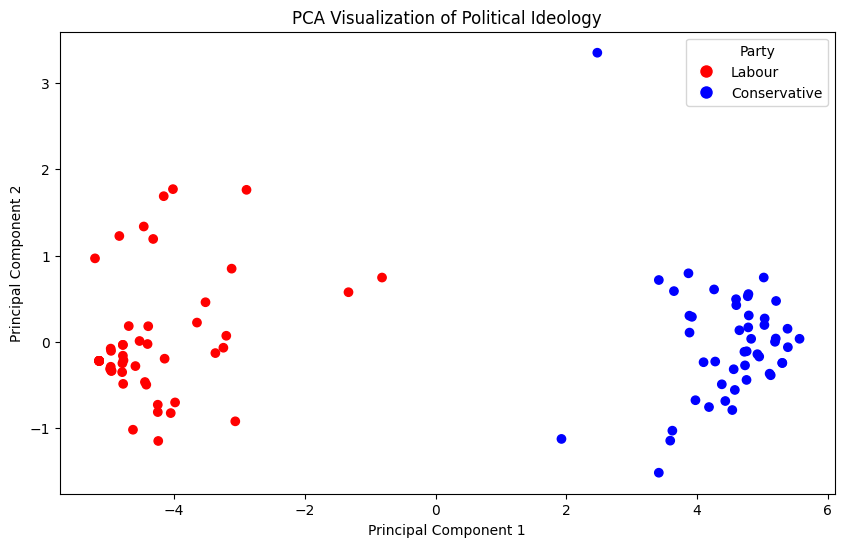

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load data
truth_df = pd.read_csv('votingRecord.csv', lineterminator='\r', low_memory=False)

# Split data into Labour and Tory
labour = truth_df[:49]
tory = truth_df[49:]

# Extract politician names
politicians = truth_df['MP']

# Extract voting records
votes_matrix = truth_df.iloc[:, 1:].values

# Perform PCA
pca = PCA(n_components=2, random_state=42)
projections = pca.fit_transform(votes_matrix)

# Plotting
x = projections[:, 0]
colors = ['red' if val < 0 else 'blue' for val in x]

plt.figure(figsize=(10, 6))
plt.scatter(projections[:, 0], projections[:, 1], c=colors)

plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Labour'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Conservative'),
], title='Party', loc='upper right')

# Uncomment to see that the graph is correct just that a lot of the points have been grouped together do the similar voting patterns
# for i, mp_id in enumerate(politicians):
#     plt.annotate(mp_id, (projections[i, 0], projections[i, 1]))

plt.title('PCA Visualization of Political Ideology')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()


In [60]:
print(politicians)

0     https://www.twitter.com/Debbie_abrahams
1              https://twitter.com/TahirAliMP
2          https://twitter.com/MikeAmesburyMP
3         https://twitter.com/ToniaAntoniazzi
4           https://twitter.com/PaulaBarkerMP
                       ...                   
93           https://twitter.com/robertcourts
94         https://twitter.com/ClaireCoutinho
95           https://twitter.com/Geoffrey_Cox
96            https://twitter.com/scrabbpembs
97          https://twitter.com/tracey_crouch
Name: MP, Length: 98, dtype: object


In [47]:
print(len(x))

98


array([0.        , 0.00586759, 0.00586759, 0.00586759, 0.00586759,
       0.00586759, 0.00586759, 0.00586759, 0.02140048, 0.02226978,
       0.0223582 , 0.02277183, 0.02291975, 0.02360203, 0.03452304,
       0.03856703, 0.03889019, 0.03955777, 0.03955777, 0.0395881 ,
       0.03997284, 0.04043485, 0.04791295, 0.05389082, 0.05735864,
       0.06321873, 0.06920969, 0.07087991, 0.07279493, 0.07460491,
       0.07554103, 0.08257939, 0.0890898 , 0.08912833, 0.08975118,
       0.09754461, 0.09880473, 0.10748557, 0.11064543, 0.11366086,
       0.14473529, 0.15683061, 0.17084613, 0.18220679, 0.18632215,
       0.19393067, 0.19910292, 0.21503828, 0.35978601, 0.40739159,
       0.66206196, 0.71296123, 0.80024661, 0.80027563, 0.81645631,
       0.81947959, 0.82173394, 0.84232142, 0.8436567 , 0.84384   ,
       0.84723218, 0.85224428, 0.86375955, 0.87148698, 0.87871188,
       0.88029809, 0.88966309, 0.89459195, 0.90453715, 0.90652234,
       0.9081576 , 0.90987528, 0.91019704, 0.914622  , 0.92172

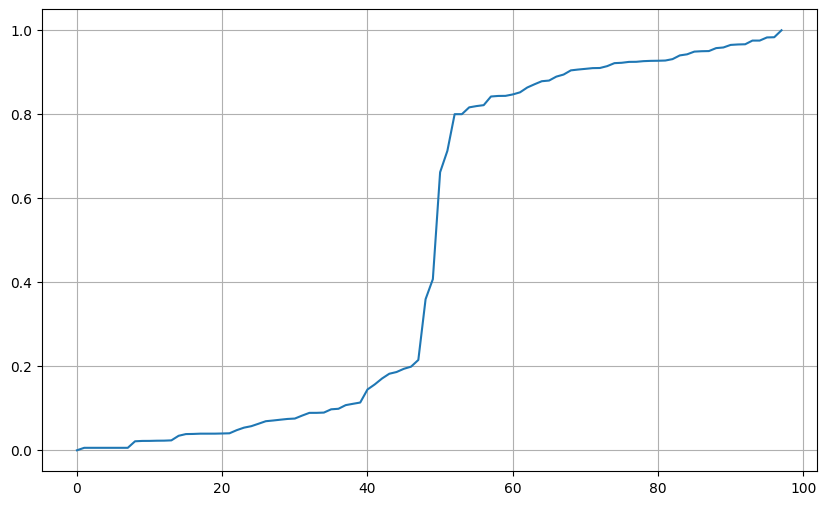

In [48]:
x = projections[:, 0]
x = (x - np.min(x)) / (np.max(x) - np.min(x))
x.sort()
plt.figure(figsize=(10, 6))
plt.grid(True)
plt.plot(x)
x

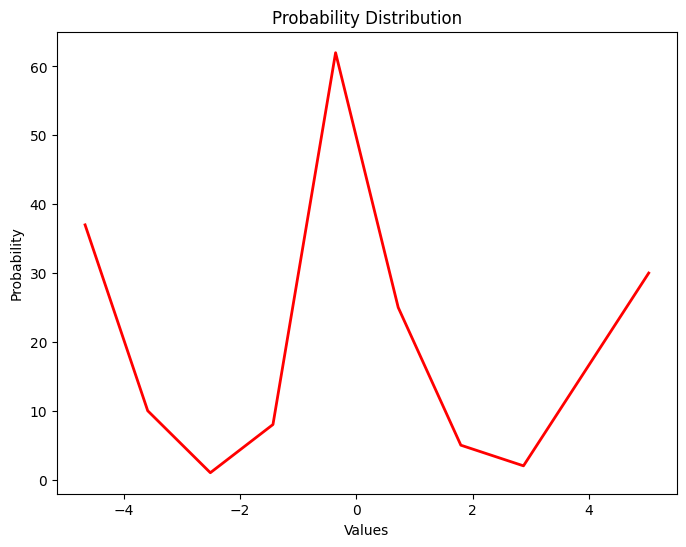

In [49]:
# projections = (projections - np.min(projections)) / (np.max(projections) - np.min(projections))
hist, bins = np.histogram(projections, bins = 10, density=False)

plt.figure(figsize=(8, 6))
# plt.hist(opinion_values, bins=bins, density=True, alpha=0.6, color='g', edgecolor='black')  # Plot histogram
plt.plot((bins[:-1] + bins[1:]) / 2, hist, color='r', linewidth=2)  # Plot probability distribution
plt.title('Probability Distribution')
plt.xlabel('Values')
plt.ylabel('Probability')

plt.show()

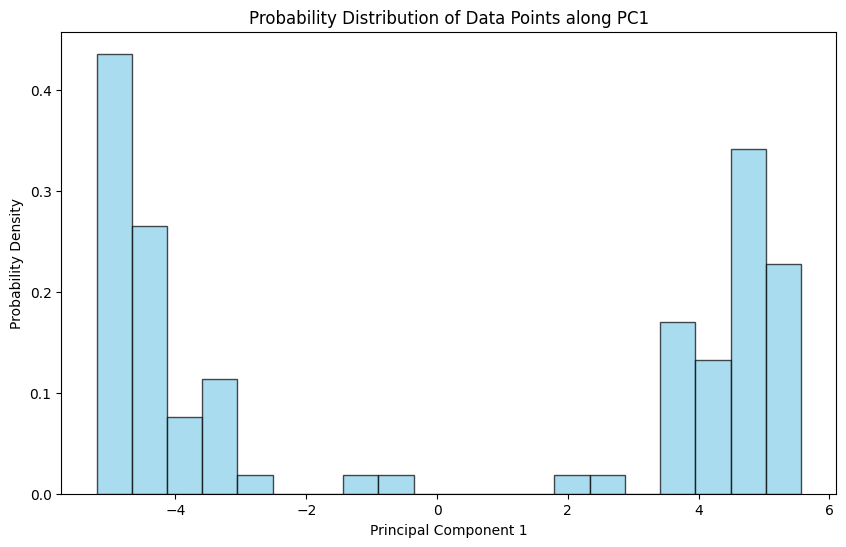

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load data
truth_df = pd.read_csv('votingRecord.csv', lineterminator='\r', low_memory=False)

# Split data into Labour and Tory
labour = truth_df[:49]
tory = truth_df[49:]

# Extract politician names
politicians = truth_df['MP']

# Extract voting records
votes_matrix = truth_df.iloc[:, 1:].values

# Perform PCA
pca = PCA(n_components=2, random_state=42)
projections = pca.fit_transform(votes_matrix)

# Plotting
x = projections[:, 0]

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(x, bins=20, density=True, color='skyblue', edgecolor='black', alpha=0.7)

# Add labels and title
plt.title('Probability Distribution of Data Points along PC1')
plt.xlabel('Principal Component 1')
plt.ylabel('Probability Density')

plt.show()


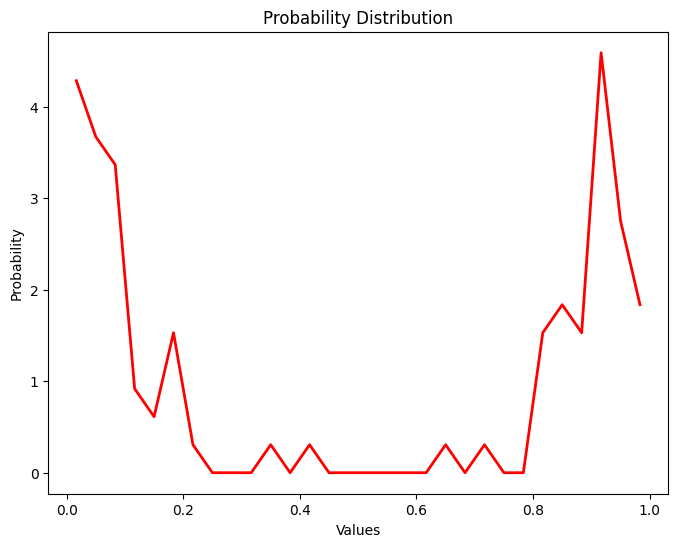

In [51]:
x = projections[:, 0]
x = (x - np.min(x)) / (np.max(x) - np.min(x))
hist, bins = np.histogram(x, bins=30, density=True)  # Calculate histogram and normalize by density

# Step 4: Plot the distribution
plt.figure(figsize=(8, 6))
# plt.hist(opinion_values, bins=bins, density=True, alpha=0.6, color='g', edgecolor='black')  # Plot histogram
plt.plot((bins[:-1] + bins[1:]) / 2, hist, color='r', linewidth=2)  # Plot probability distribution
plt.title('Probability Distribution')
plt.xlabel('Values')
plt.ylabel('Probability')
plt.show()


[4.28571429 3.67346939 3.36734694 0.91836735 0.6122449  1.53061224
 0.30612245 0.         0.         0.         0.30612245 0.
 0.30612245 0.         0.         0.         0.         0.
 0.         0.30612245 0.         0.30612245 0.         0.
 1.53061224 1.83673469 1.53061224 4.59183673 2.75510204 1.83673469]


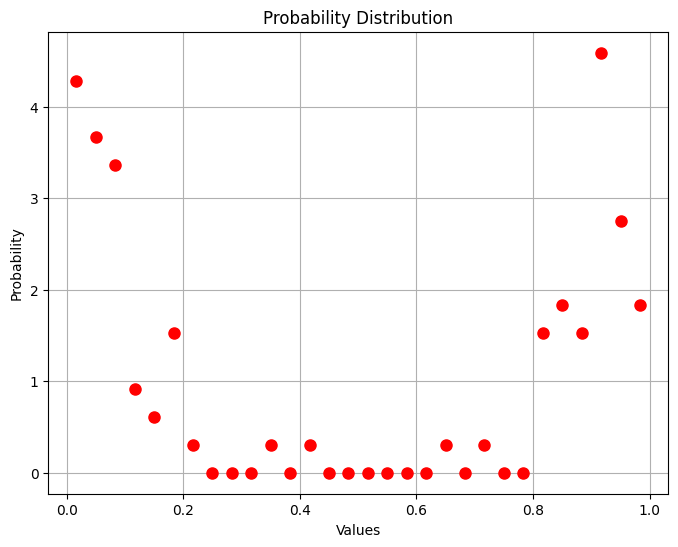

In [52]:
import numpy as np

# Calculate histogram and normalize by density
hist, bins = np.histogram(x, bins=30, density=True)

# Calculate the center of each bin
bin_centers = (bins[:-1] + bins[1:]) / 2

# Take every 2nd point
bin_centers = bin_centers
hist = hist

print(hist)
# Plot the distribution with points
plt.figure(figsize=(8, 6))
plt.plot(bin_centers, hist, 'ro', markersize=8)  # Plot probability distribution with points
plt.title('Probability Distribution')
plt.xlabel('Values')
plt.ylabel('Probability')
plt.grid(True)
plt.show()


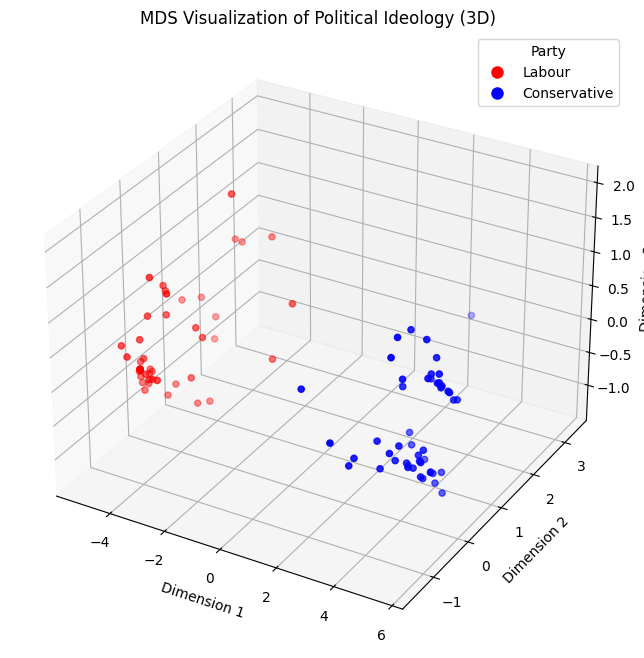

In [53]:
truth_df = pd.read_csv('votingRecord.csv', lineterminator='\n', low_memory=False)
labour = truth_df[:49]
tory = truth_df[49:]

politicians = truth_df['MP']
votes_matrix = truth_df.iloc[:, 1:].values

pca = PCA(n_components=3, random_state=42)
projections_3d = pca.fit_transform(votes_matrix)

# Extract 3D coordinates
x_3d = projections_3d[:, 0]
y_3d = projections_3d[:, 1]
z_3d = projections_3d[:, 2]

colors = ['red' if val < 0 else 'blue' for val in x_3d]
labels = ['C' if val >= 0 else 'R' for val in x_3d]

# Create a 3D scatter plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x_3d, y_3d, z_3d, c=colors)

ax.set_xlabel('Dimension 1')
ax.set_ylabel('Dimension 2')
ax.set_zlabel('Dimension 3')

ax.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Labour'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Conservative'),
], title='Party', loc='upper right')

# for i, mp_id in enumerate(politicians):
#     ax.text(x_3d[i], y_3d[i], z_3d[i], mp_id)

plt.title('MDS Visualization of Political Ideology (3D)')
plt.show()


In [54]:
# # Your existing code for reading data and performing MDS
# truth_df = pd.read_csv('votingRecord.csv', lineterminator='\n', low_memory=False)
# labour = truth_df[:49]
# tory = truth_df[49:]

# politicians = truth_df['MP']
# votes_matrix = truth_df.iloc[:, 1:].values

# mds = MDS(n_components=3, dissimilarity="euclidean", random_state=42, metric=False)
# projections_3d = mds.fit_transform(votes_matrix)

# # Create a DataFrame for Plotly
# df = pd.DataFrame({
#     'MP': politicians,
#     'Dimension 1': projections_3d[:, 0],
#     'Dimension 2': projections_3d[:, 1],
#     'Dimension 3': projections_3d[:, 2],
#     'Party': ['Labour' if val < 0 else 'Conservative' for val in projections_3d[:, 0]]
# })

# # Create an interactive 3D scatter plot with Plotly
# fig = px.scatter_3d(df, x='Dimension 1', y='Dimension 2', z='Dimension 3', color='Party',
#                     title='MDS Visualization of Political Ideology (Interactive)',
#                     labels={'Dimension 1': 'X', 'Dimension 2': 'Y', 'Dimension 3': 'Z'},
#                     color_discrete_map={'Labour': 'red', 'Conservative': 'blue'})

# # Show the plot
# fig.show()


## Creating the Embedding Space

In [55]:
# removing accounts with < k followers 
def remove_below_threshold(degree, k):
    keys_to_remove = [key for key, value in degree.items() if value < k]
    
    for key in keys_to_remove:
        del degree[key]

    return degree

[91250, 91250, 18064, 9592, 6478, 4814, 3836, 3122, 2607, 2242, 1981, 1758, 1576, 1428, 1293, 1188, 1082, 1002, 923, 852, 806, 745, 702, 650, 607, 567, 542, 510, 488, 456, 434, 418, 399, 384, 364, 341, 319, 301, 288, 269, 253, 241, 232, 221, 212, 203, 189, 182, 174, 166, 157, 151, 147, 140, 133, 122, 114, 105, 99, 93, 89, 87, 78, 69, 65, 62, 59, 52, 48, 41, 37, 35, 30, 27, 25, 23, 22, 20, 19, 17, 13, 10, 9, 9, 8, 7, 6, 6, 4, 3, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0]


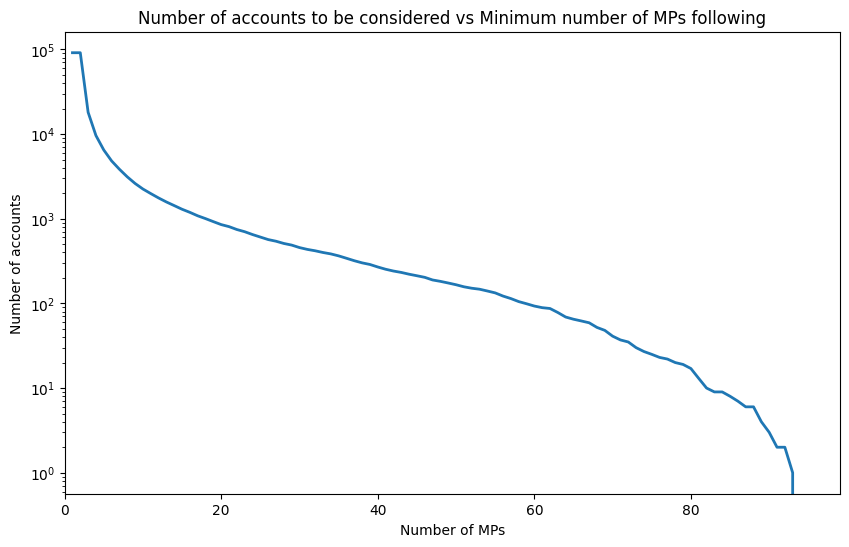

100


In [63]:
bi_paritite = {**data, **tory_data}
degree = {**tory_degree, **degree}

def recordDegreeLength(degree):
    k_num = np.arange(0, 100 ,1).tolist()
    res = []
    for k in k_num:
        dictionaryLength = len(remove_below_threshold(degree, k))
        res.append(dictionaryLength)
    return res

res = recordDegreeLength(degree)
print(res)
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(res) + 1), res, linestyle='-', linewidth=2)
plt.title('Number of accounts to be considered vs Minimum number of MPs following')
plt.xlabel('Number of MPs')
plt.ylabel('Number of accounts')
plt.xlim(0, len(res)-1)
# plt.ylim(0, max(res))
plt.yscale('log')
plt.show()

print(len(res))

In [39]:
delta_y = np.diff(res)

# Find the index where the change in y is closest to 1
index = np.argmin(np.abs(delta_y - 1))

# Find the corresponding x value
x_value = index + 1

print("The value of x where the gradient becomes 45 degrees is:", x_value)

The value of x where the gradient becomes 45 degrees is: 1


Lets use 3 as our value of k for now

In [40]:
MPs = np.array(list(bi_paritite.keys()))
encoder = LabelEncoder()
one_hot_encoded = encoder.fit_transform(np.array(MPs).reshape(-1, 1))

encoder_accounts = OneHotEncoder()
all_accounts = list(set([person for followers in bi_paritite.values() for person in followers]))
one_hot_encoded_accounts = encoder_accounts.fit_transform(np.array(all_accounts).reshape(-1, 1))

svd = TruncatedSVD(n_components=100)
one_hot_encoded_accounts = svd.fit_transform(one_hot_encoded_accounts)

encoding_mapping_all_accounts = {all_accounts[i]: one_hot_encoded_accounts[i] for i in range(len(all_accounts))}
encoding_mapping_MPs = {MPs[i]: one_hot_encoded[i] for i in range(len(MPs))}

d:\Python\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [41]:
degree = {**tory_degree, **degree}
degree = remove_below_threshold(degree, 3)
all_accounts = []

for key, value in degree.items():
    all_accounts.append(key)
    
encoder = OneHotEncoder()
one_hot_encoded_accounts = encoder.fit_transform(np.array(all_accounts).reshape(-1, 1)).toarray()

encoding_mapping_all_accounts = {all_accounts[i]: one_hot_encoded_accounts[i] for i in range(len(all_accounts))}
reverse_mapping = {str(one_hot_encoded_accounts[i]): all_accounts[i] for i in range(len(all_accounts))}


In [42]:
encoded_data = []
for index, (account, followers) in enumerate(bi_paritite.items()):
    for follower in followers:
        try:
            if follower not in degree:
                continue
            encoded_data.append((encoding_mapping_MPs[account], encoding_mapping_all_accounts[follower]))
        except KeyError:
            continue

In [43]:
encoded_dict = {}
for account, followers in bi_paritite.items():
    try:
        account_key = encoding_mapping_MPs[account]
        encoded_dict[account_key] = []
        for follower in followers:
            if follower not in degree:
                continue
            follower_value = encoding_mapping_all_accounts[follower]
            encoded_dict[account_key].append(follower_value)
            
    except KeyError:
        continue


## Defining a Projection Vector

Calculating the projection vector for the most similar accounts?

In [44]:
class OpinionMeasurementModel(nn.Module):
    def __init__(self, mp_num, emb_dimension, hidden_dimension):
        super(OpinionMeasurementModel, self).__init__()
        self.num_mps = mp_num
        self.emb_dimension = emb_dimension
        self.hidden_dimension = hidden_dimension
        
        self.u_embeddings = nn.Embedding(mp_num, emb_dimension, sparse=True)
        self.hidden_layer = nn.Linear(emb_dimension, hidden_dimension)
        self.output_layer = nn.Linear(hidden_dimension, mp_num)
        
        initrange = 1.0 / self.emb_dimension
        init.uniform_(self.u_embeddings.weight.data, -initrange, initrange)
        nn.init.xavier_uniform_(self.hidden_layer.weight.data)
        nn.init.xavier_uniform_(self.output_layer.weight.data)
        
    def forward(self, x):
        emb_center = self.u_embeddings(x)
        hidden = torch.relu(self.hidden_layer(emb_center))
        output = self.output_layer(hidden)
        
        # return torch.sigmoid(output)
        return F.log_softmax(output, dim = 1)
    

In [45]:
class Dataset(torch.utils.data.Dataset):
    def __init__(self, encoded_data):
        self.data = encoded_data
    
    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        account = self.data[idx][0]
        followers = self.data[idx][1]
        # account, followers = self.data[idx]
        # padded_followers = pad_sequence([torch.tensor(follower) for follower in followers], batch_first=True)
        
        return torch.tensor(account), torch.tensor(followers)


In [46]:

'''
Each account can be registed with several different users, dealing with a mutli-label classification problem
Thus we need to use BCE with Logits Loss
'''
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

dataset = Dataset(encoded_data)
batch_size = 20
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

input_size = len(one_hot_encoded_accounts)
output_size = len(MPs)
model = OpinionMeasurementModel(output_size, 50, 64).to(device)

criterion = nn.BCEWithLogitsLoss()
crossCriterion = nn.CrossEntropyLoss()

optimizer = optim.SGD(model.parameters(), lr = 0.1)



In [47]:

num_epochs = 1000
for epoch in range(num_epochs):
    total_loss = 0.0

    for account, followers in data_loader:
        
        account, followers = account.to(device), followers.to(device)
        
        optimizer.zero_grad()
        outputs = model(followers.int())
        
        print(outputs.shape)
        account_one_hot = torch.zeros_like(outputs)
        print(account_one_hot.shape, account.shape)
        account_one_hot.scatter_(1, account.unsqueeze(1), 1)
                
        loss = criterion(outputs, account_one_hot)
    

        loss.backward()
        optimizer.step()
    
        
        total_loss += loss.item()   
        
    print(f'Epoch {epoch + 1}, Loss: {total_loss / len(data_loader)}')


torch.Size([20, 9592, 199])
torch.Size([20, 9592, 199]) torch.Size([20])


RuntimeError: Index tensor must have the same number of dimensions as self tensor

In [ ]:
        # labels = torch.zeros_like(outputs, device = device)
        
        # print(outputs.squeeze().shape)
        
        # for batch_num, batch in enumerate(followers):    
        #     for j, mp in enumerate(bi_paritite):
        #         batch_cpu = batch.cpu().numpy()
        #         user = reverse_mapping[str(np.array(batch_cpu))]
        #         if user in bi_paritite[mp]:
        #             labels[batch_num, np.argmax(batch_cpu), j] = 1  

In [ ]:
tensor = np.array([0, 0, 1, 0, 0])

# Find the index where the value is 1
index = np.argmax(tensor)
print(index)

2


In [ ]:
model_path = 'trained_model.pth'
torch.save(model.state_dict(), model_path)

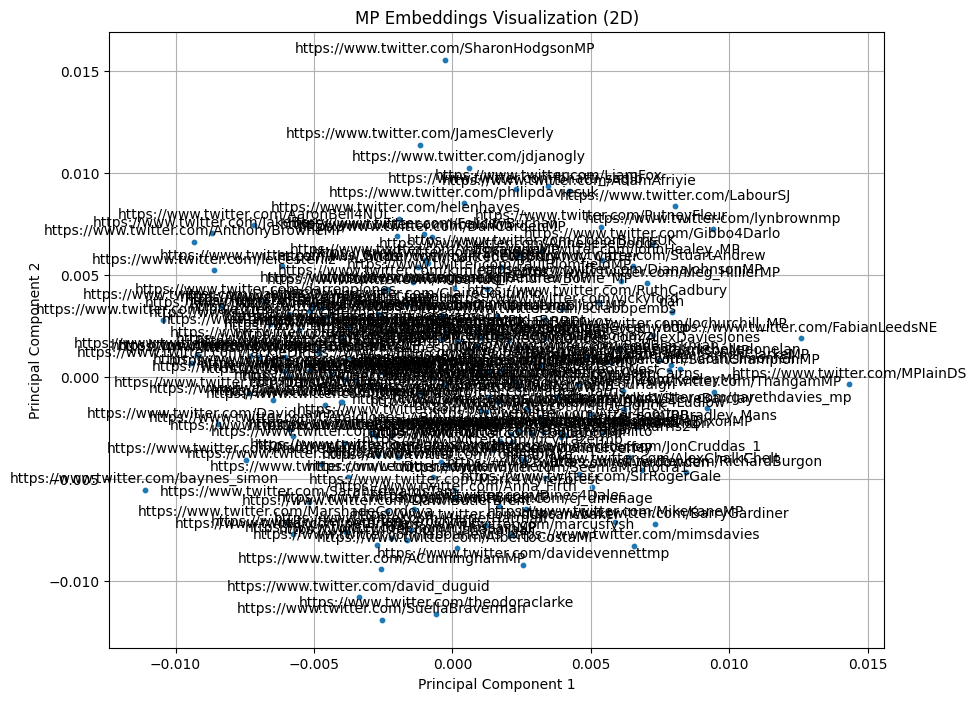

In [ ]:
# Step 1: Extract embeddings
embeddings = model.u_embeddings.weight.data.cpu().numpy()

# Step 2: Perform dimensionality reduction using PCA
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embeddings)

# Step 3: Plot embeddings
plt.figure(figsize=(10, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], s=10)
plt.title('MP Embeddings Visualization (2D)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Annotate each point with MP index
for i, (x, y) in enumerate(embeddings_2d):
    # Retrieve MP name from the encoding_mapping_MPs dictionary
    mp_name = list(encoding_mapping_MPs.keys())[list(encoding_mapping_MPs.values()).index(i)]
    plt.annotate(mp_name, (x, y), textcoords="offset points", xytext=(0, 5), ha='center') 

plt.grid(True)
plt.show()

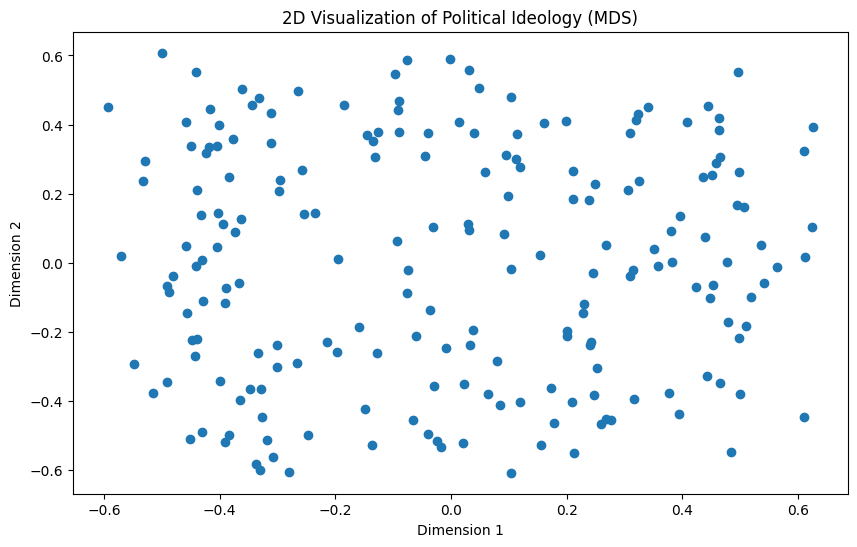

In [ ]:
# Extract embeddings
embeddings = model.u_embeddings.weight.data.numpy()

# Perform dimensionality reduction (MDS)
mds = MDS(n_components=2, dissimilarity="euclidean", random_state=42, metric=False)
embeddings_2d = mds.fit_transform(embeddings)

# tsne = TSNE(n_components=2, perplexity=30, random_state=42)
# embeddings_2d = tsne.fit_transform(embeddings)


# Plotting
x_2d = embeddings_2d[:, 0]
y_2d = embeddings_2d[:, 1]

plt.figure(figsize=(10, 6))
plt.scatter(x_2d, y_2d)
# for i, (x, y) in enumerate(embeddings_2d):
#     # Retrieve MP name from the encoding_mapping_MPs dictionary
#     mp_name = list(encoding_mapping_MPs.keys())[list(encoding_mapping_MPs.values()).index(i)]
#     plt.annotate(mp_name, (x, y), textcoords="offset points", xytext=(0, 5), ha='center') 

plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('2D Visualization of Political Ideology (MDS)')
plt.show()
